## Data Exploration & Data Split

## Preprocessing
<ul>
    <li>Prepare the data</li>
    <li>Data split:</li>
    <ul>
        <li>Train data and test data are split in the image-dataset directory</li>
    </ul>
</ul>

        
## Methods

### Baseline CNN 
<ul>
    <li> Convolutional Nural Ntwork </li>
</ul>

### Transfer Learning
<ul>
    <li> RESNET34 </li>
    <li> RESNET50</li>
    <li> Vgg19_bn</li>
    <li> Alexnet </li>
    <li> Densenet201</li>
    <li> Mobilenet_v2
    <li> Squeezenet1_1 </li>
    <li> InceptionV3</li>
</ul>
 
 
## Model Evaluation
<ul>
    <li>Evaluate how accuarate the model performs with respect to the data in terms of prediction accuracy and other classifcation metrics </li>
    <li>Find the average error of your model (use testing data only) a.k.a model test/prediction evaluation</li>
</ul>


## Results


| | | | Model Accuracy | | | | 
|------|------|------|------|------|------|------|

|Resnet34|Resnet50|Vgg19|Alextnet|Densenet201|Mobilenet_v2|Squeezenet1_1|Cnn|
|------|------|------|------|------|------|------|------|
|0.836|0.849|0.830|0.828|0.864|0.849|0.829|0.778


# 1.Import Libraries

In [1]:
from numpy.random import seed
seed(101)

import pandas as pd
import numpy as np
from glob import glob 

from fastai.vision import *
from fastai.metrics import error_rate
import os
import cv2

import imageio
import skimage
import skimage.io
import skimage.transform

from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
import itertools
import shutil
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
os.listdir('./origina_dataset')

['coronahack-chest-xraydataset']

# 2.Exploratory Data Analysis

In [3]:
print(len(os.listdir('origina_datasett/train/')))
print(len(os.listdir('origina_dataset/test/')))


5503
600


In [4]:
path_train = "origina_dataset/train/"
path_test = "origina_dataset/test/"
meta_path = "origina_dataset"

In [5]:
meta_data = pd.read_csv(meta_path+'Chest_xray_Corona_Metadata.csv',index_col=[0])
meta_data.head()

,X_ray_image_name,Label,Dataset_type,Label_2_Virus_category,Label_1_Virus_category
0,IM-0128-0001.jpeg,Normal,TRAIN,NaN,NaN
1,IM-0127-0001.jpeg,Normal,TRAIN,NaN,NaN
2,IM-0125-0001.jpeg,Normal,TRAIN,NaN,NaN
3,IM-0122-0001.jpeg,Normal,TRAIN,NaN,NaN
4,IM-0119-0001.jpeg,Normal,TRAIN,NaN,NaN


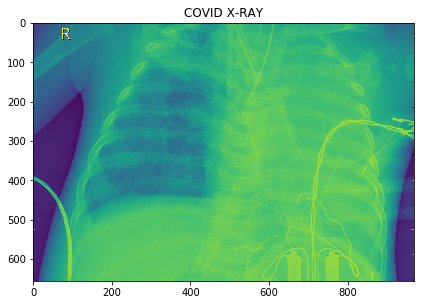

In [6]:
plt.figure(1, figsize = (15 , 7))
plt.subplot(1 , 2 , 1)
img = glob(path_train+"/*.jpeg") 
img = np.asarray(plt.imread(img[0]))
plt.title('COVID X-RAY')
plt.imshow(img)

# 3.Data Preprocessing

In [7]:
def copy_img(src_path,dst_path):
    try:
        shutil.copy(src_path, dst_path)
        stmt ='File Copied'
    except IOError as e:
        print('Unable to copy file {} to {}'
              .format(src_path, dst_path))
        stmt ='Copy Failed - IO Error'
    except:
        print('When try copy file {} to {}, unexpected error: {}'
              .format(src_path, dst_path, sys.exc_info()))
        stmt ='Copy Failed - other Error'+ sys.exc_info()
        
    return stmt

In [8]:
data_dir="./origina_dataset/"
metadata_path="./origina_dataset/"

In [9]:
train_dir = os.path.join(data_dir, 'train')
test_dir = os.path.join(data_dir, 'test')

In [10]:
meta_data['File_path']=''
meta_data.loc[meta_data['Dataset_type']=='TRAIN','File_path']=train_dir+'/'
meta_data.loc[meta_data['Dataset_type']=='TEST','File_path']=test_dir+'/'
meta_data['X_ray_img_nm_path']=meta_data['File_path']+meta_data['X_ray_image_name']

In [11]:
meta_data.head()

,X_ray_image_name,Label,Dataset_type,Label_2_Virus_category,Label_1_Virus_category,File_path,X_ray_img_nm_path
0,IM-0128-0001.jpeg,Normal,TRAIN,NaN,NaN,./kaggle/input/coronahack-chest-xraydataset/Co...,./kaggle/input/coronahack-chest-xraydataset/Co...
1,IM-0127-0001.jpeg,Normal,TRAIN,NaN,NaN,./kaggle/input/coronahack-chest-xraydataset/Co...,./kaggle/input/coronahack-chest-xraydataset/Co...
2,IM-0125-0001.jpeg,Normal,TRAIN,NaN,NaN,./kaggle/input/coronahack-chest-xraydataset/Co...,./kaggle/input/coronahack-chest-xraydataset/Co...
3,IM-0122-0001.jpeg,Normal,TRAIN,NaN,NaN,./kaggle/input/coronahack-chest-xraydataset/Co...,./kaggle/input/coronahack-chest-xraydataset/Co...
4,IM-0119-0001.jpeg,Normal,TRAIN,NaN,NaN,./kaggle/input/coronahack-chest-xraydataset/Co...,./kaggle/input/coronahack-chest-xraydataset/Co...


In [12]:
meta_COVID_19_train = meta_data[(meta_data['Dataset_type']=='TRAIN') & 
                        ((meta_data['Label']=='Normal')|(meta_data['Label']=='Pnemonia') & (meta_data['Label_2_Virus_category']=='COVID-19'))]


meta_COVID_19_test = meta_data[(meta_data['Dataset_type']=='TEST') & 
                        ((meta_data['Label']=='Normal')|(meta_data['Label']=='Pnemonia') & (meta_data['Label_2_Virus_category']=='COVID-19'))]


## Moving the 10 Corona Infected dataset to Test

meta_data_covid_test = meta_data[meta_data['Label_2_Virus_category']=='COVID-19'].sample(12)
meta_COVID_19_train = meta_COVID_19_train[~meta_COVID_19_train['X_ray_image_name'].isin(meta_data_covid_test['X_ray_image_name'])]
meta_COVID_19_test_fnl = pd.concat([meta_data_covid_test,meta_COVID_19_test],ignore_index=False)

In [13]:
meta_COVID_19_train.loc[meta_COVID_19_train['Label'] =='Pnemonia','Label']='COVID19'
meta_COVID_19_test_fnl.loc[meta_COVID_19_test_fnl['Label'] =='Pnemonia','Label']='COVID19'

In [14]:
meta_COVID_19_train['Img_tgt_path']="/origina_dataset/train/"
meta_COVID_19_test_fnl['Img_tgt_path']="/origina_dataset/test/"

In [15]:
meta_COVID_19_train.loc[meta_COVID_19_train['Label']=='Normal','Img_tgt_path']=meta_COVID_19_train['Img_tgt_path']+'Normal/'
meta_COVID_19_train.loc[meta_COVID_19_train['Label']=='COVID19','Img_tgt_path']=meta_COVID_19_train['Img_tgt_path']+'COVID19/'

meta_COVID_19_test_fnl.loc[meta_COVID_19_test_fnl['Label']=='Normal','Img_tgt_path']=meta_COVID_19_test_fnl['Img_tgt_path']+'Normal/'
meta_COVID_19_test_fnl.loc[meta_COVID_19_test_fnl['Label']=='COVID19','Img_tgt_path']=meta_COVID_19_test_fnl['Img_tgt_path']+'COVID19/'

In [16]:
dirname = './dataset'


train_path = os.path.join(dirname, 'train/')
train_nrml_pth = os.path.join(train_path, 'Normal/')
train_covid19_pth = os.path.join(train_path, 'Covid/')

test_path = os.path.join(dirname, 'test/')
test_nrml_pth = os.path.join(train_path, 'Normal/')
test_covid19_pth = os.path.join(train_path, 'Covid/')

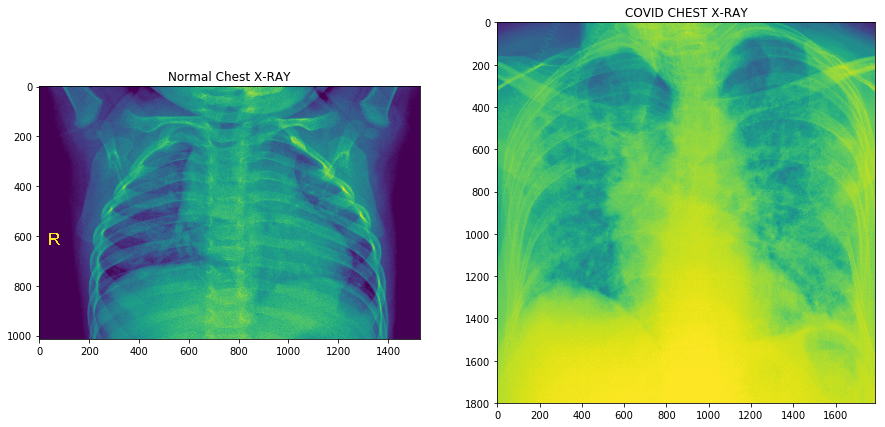

In [17]:
plt.figure(1, figsize = (15 , 7))
plt.subplot(1 , 2 , 1)
img = glob(train_nrml_pth+"/*.jpeg")
img = np.asarray(plt.imread(img[0]))
plt.title('Normal Chest X-RAY')
plt.imshow(img)

plt.subplot(1 , 2 , 2)
img = glob(train_covid19_pth+"/*.jpeg") 
img = np.asarray(plt.imread(img[0]))
plt.title('COVID CHEST X-RAY')
plt.imshow(img)

plt.show()

In [18]:
src = (ImageList.from_folder(dirname)
       .split_by_rand_pct(valid_pct=0.2)
       .label_from_folder()
       .transform(get_transforms(), size=256)
       .add_test_folder(test_path))

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

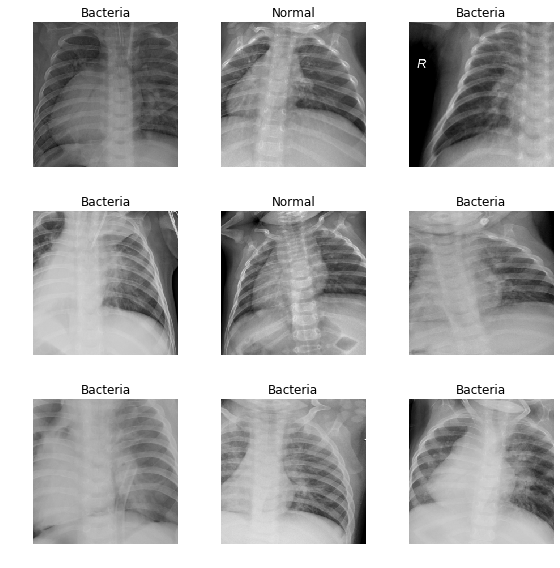

In [19]:
data = (src.databunch(bs=32)
        .normalize(imagenet_stats))

data.show_batch(rows=3,figsize=(8,8))

In [20]:
#lets recheck the classes
data.classes

['Bacteria', 'Covid', 'Normal', 'Virus']

In [21]:
print(data.c, len(data.train_ds), len(data.valid_ds))

4 4883 1220


# 4.Transfer Learning - RESNET34

In [22]:
learner34=cnn_learner(data,models.resnet34,metrics=accuracy)

In [23]:
#Model Training
#learner34.fit_one_cycle(1)

epoch,train_loss,valid_loss,accuracy,time
0,1.087821,0.682891,0.752459,19:24
1,0.877233,0.638897,0.763115,18:58
2,0.745799,0.510987,0.803279,19:04
3,0.622037,0.500771,0.815574,18:58
4,0.564738,0.425091,0.828689,18:59
5,0.486066,0.400680,0.848361,19:01
6,0.473168,0.389798,0.839344,19:00
7,0.450316,0.403167,0.836066,18:58


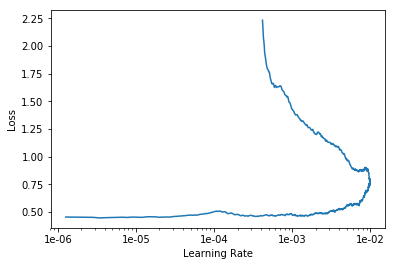

In [24]:
#find the learning rate and plot the learning rate
lr=1e-2
learner34.fit_one_cycle(8, slice(lr))
learner34.recorder.plot()

In [25]:
learner34.save('stage-1')

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

True

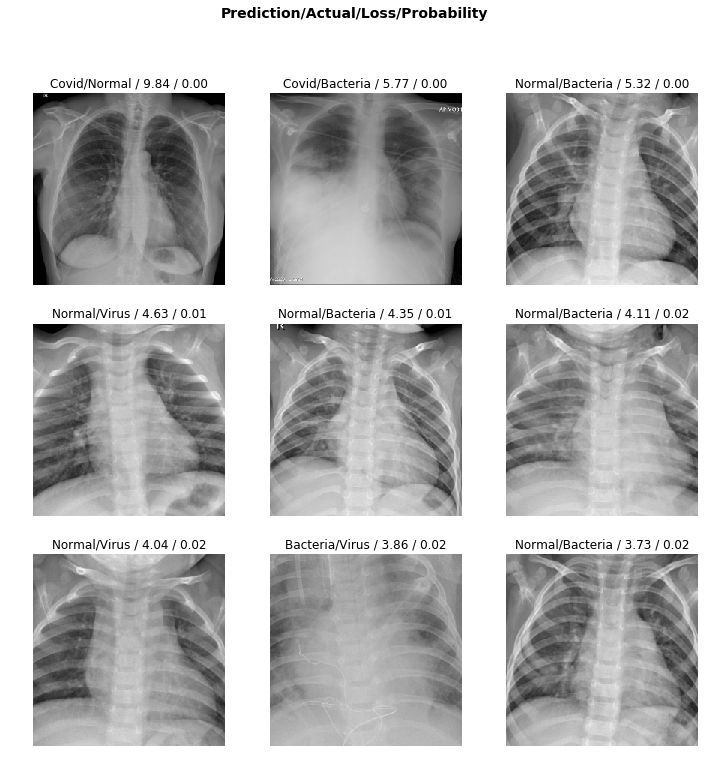

In [26]:
#Plot the losses of the model
interp=ClassificationInterpretation.from_learner(learner34)
losses,idxs = interp.top_losses()
interp.plot_top_losses(9,figsize=(12,12))
len(data.valid_ds)==len(losses)==len(idxs)

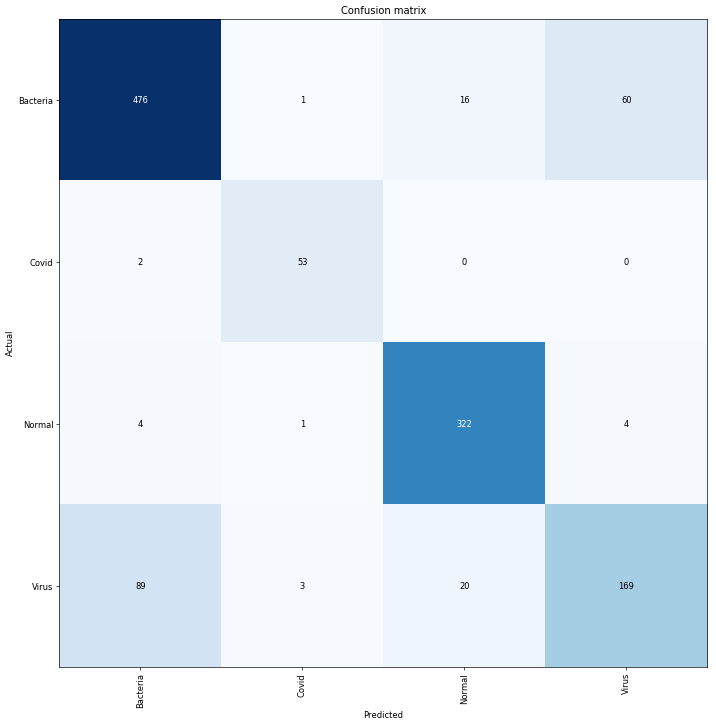

In [27]:
#Plot a confusion matrix
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [28]:
learner34.export(file = Path("output/export.pkl"))

In [29]:
learner34.save('stage-1')

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

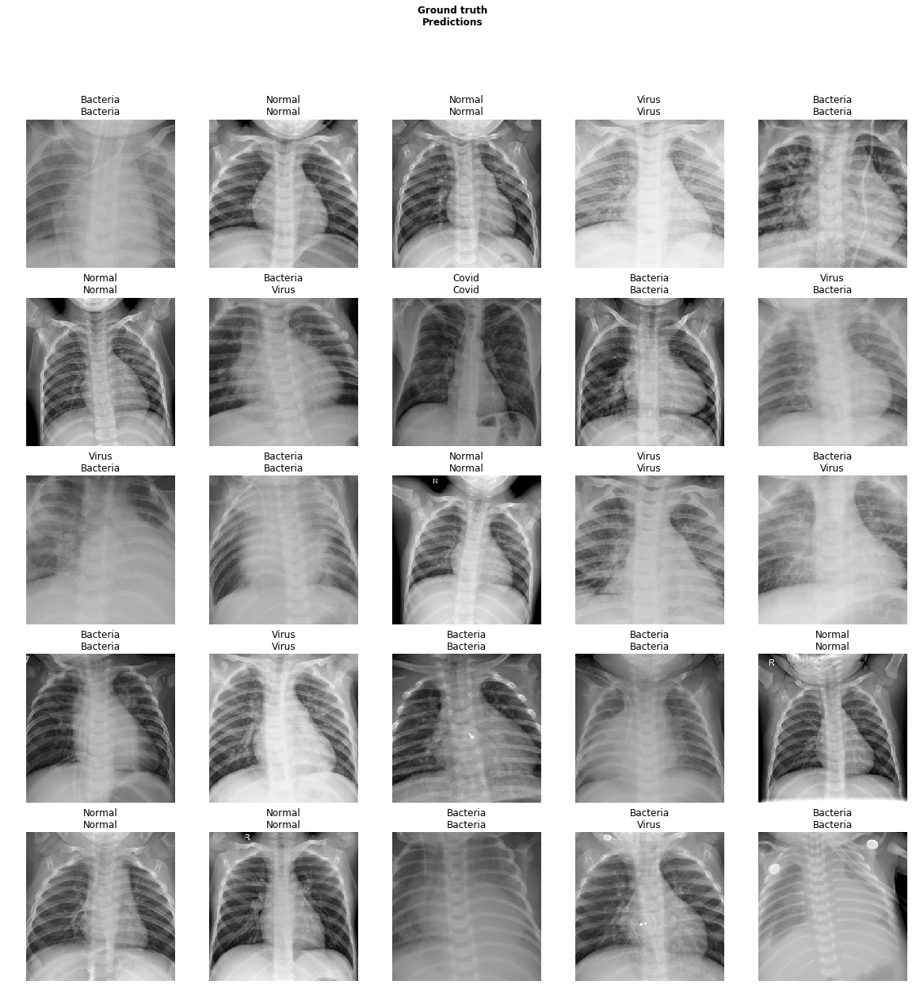

In [74]:
learner34.show_results()

# 5.Transfer Learning - RESNET50

In [30]:
learner50=cnn_learner(data,models.resnet50,metrics=accuracy)

epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


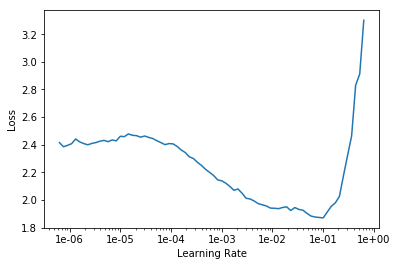

In [31]:
#Model Training
learner50.lr_find()
learner50.recorder.plot()

epoch,train_loss,valid_loss,accuracy,time
0,1.076306,0.742785,0.738525,39:46
1,0.799370,0.582290,0.795082,37:13
2,0.710556,0.494676,0.813934,36:55
3,0.592496,0.435514,0.827049,36:55
4,0.528750,0.460884,0.813934,36:46
5,0.463562,0.381146,0.850820,36:47
6,0.434391,0.383962,0.837705,36:43
7,0.396159,0.367410,0.849180,36:58


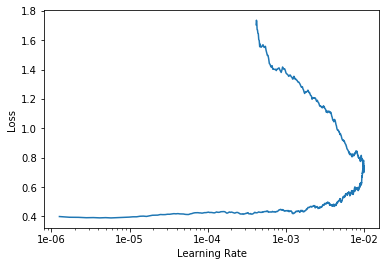

In [32]:
#find the learning rate and plot the learning rate
lr=1e-2
learner50.fit_one_cycle(8, slice(lr))
learner50.recorder.plot()
learner50.save('stage-2')

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

True

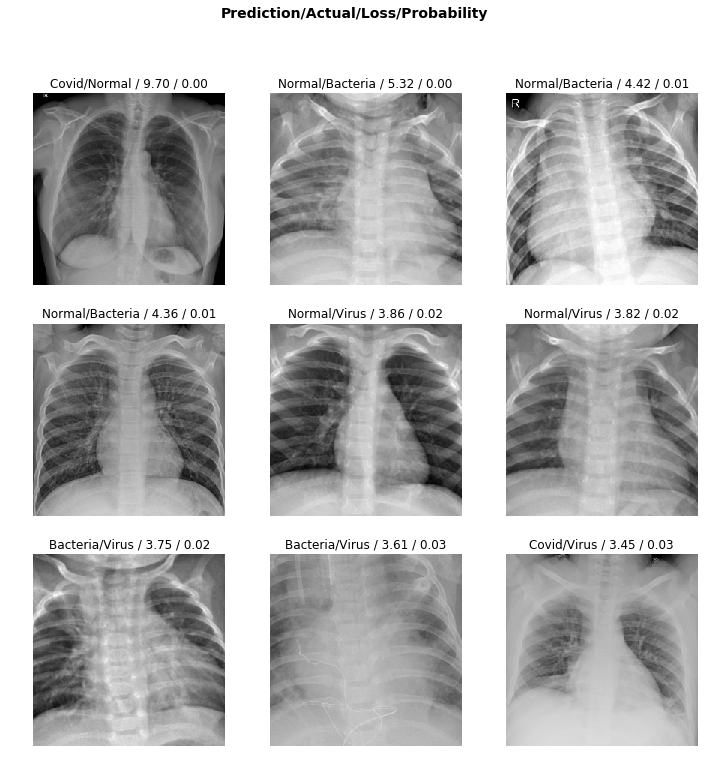

In [33]:
#Plot the losses of the model
interp=ClassificationInterpretation.from_learner(learner50)
interp.plot_top_losses(9,figsize=(12,12))
len(data.valid_ds)==len(losses)==len(idxs)

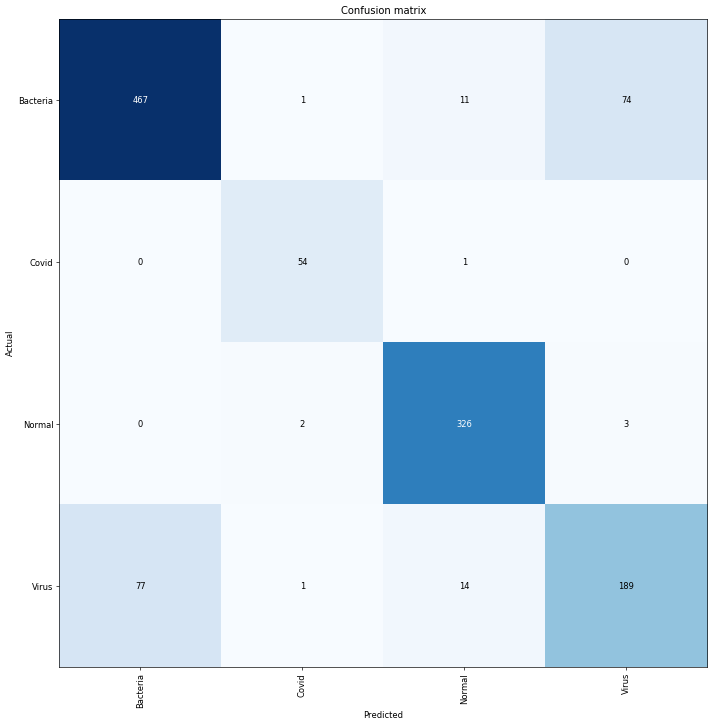

In [34]:
#Plot a confusion matrix
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [35]:
print("uohroh")

uohroh


D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

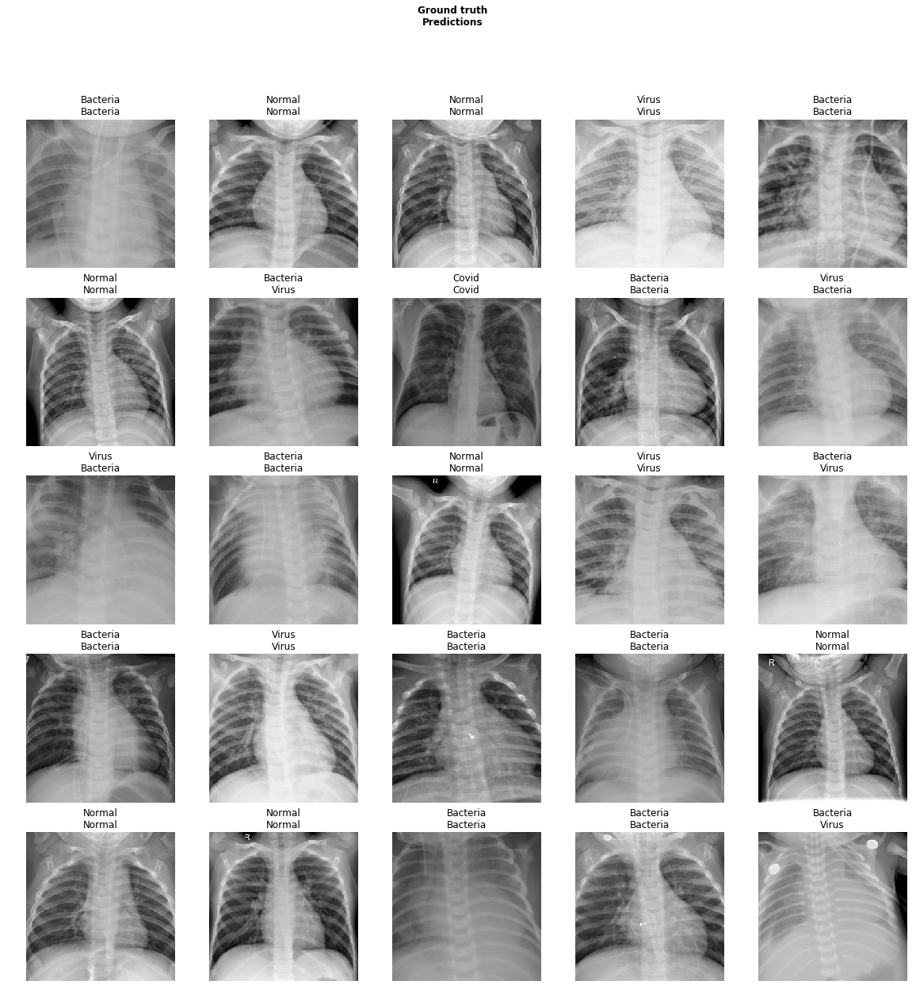

In [36]:
learner50.show_results()

# 6.Transfer Learning - vgg19_bn

In [37]:
learner_vgg19_bn= cnn_learner(data,models.vgg19_bn,metrics=accuracy)

epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


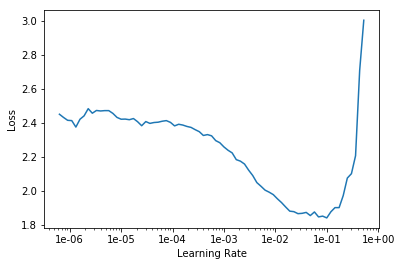

In [38]:
#Model Training
learner_vgg19_bn.lr_find()
learner_vgg19_bn.recorder.plot()

epoch,train_loss,valid_loss,accuracy,time
0,1.036976,0.698538,0.763115,1:16:41
1,0.897106,0.634520,0.763115,1:13:24
2,0.742167,0.571232,0.794262,1:07:35
3,0.621157,0.437569,0.834426,1:10:36
4,0.551619,0.410062,0.836066,1:14:02
5,0.500863,0.396870,0.831148,1:14:19
6,0.454368,0.395076,0.828689,1:13:54
7,0.442909,0.380825,0.830328,1:13:03


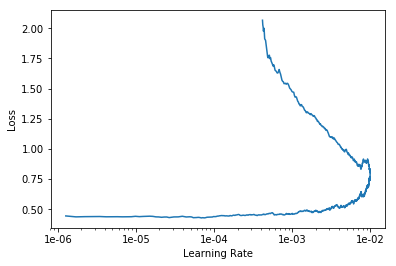

In [39]:
#find the learning rate and plot the learning rate
lr=1e-2
learner_vgg19_bn.fit_one_cycle(8, slice(lr))
learner_vgg19_bn.recorder.plot()
learner_vgg19_bn.save('stage-3')

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

True

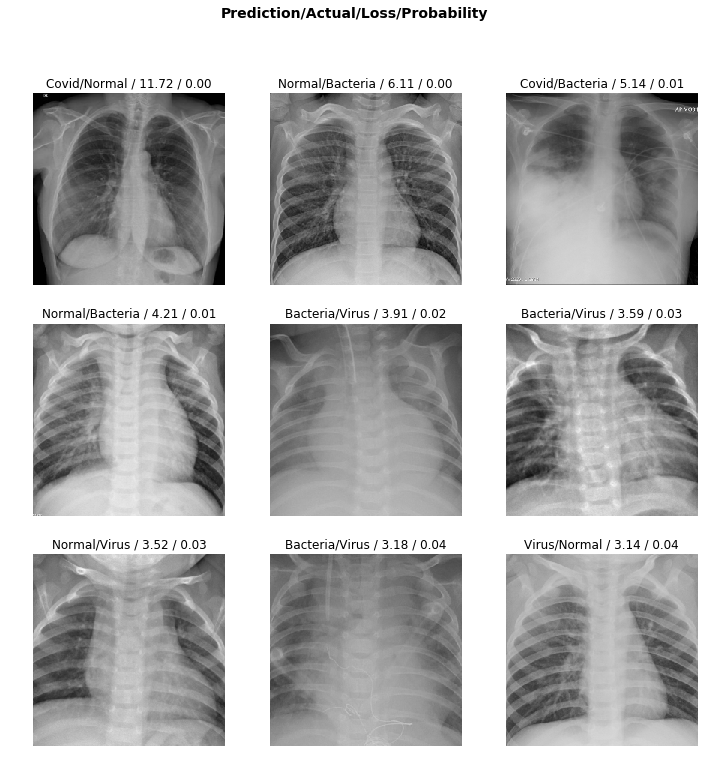

In [40]:
#Plot the losses of the model
interp=ClassificationInterpretation.from_learner(learner_vgg19_bn)
interp.plot_top_losses(9,figsize=(12,12))
len(data.valid_ds)==len(losses)==len(idxs)

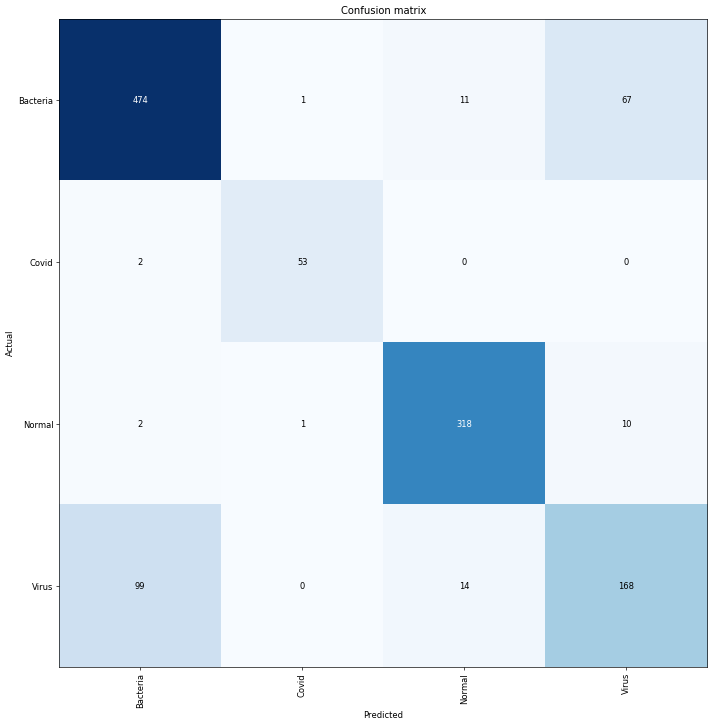

In [41]:
#Plot a confusion matrix
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

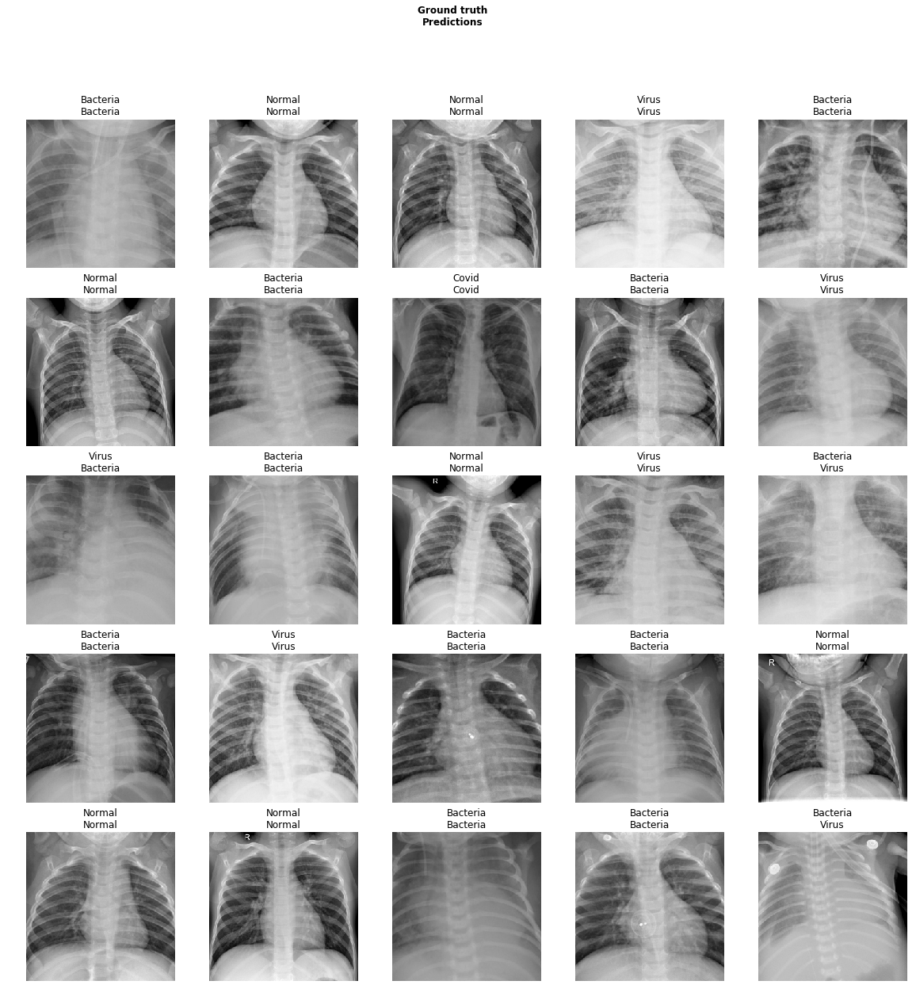

In [42]:
learner_vgg19_bn.show_results()

# 7. Transfer Learning - alexnet

In [43]:
learner_alexnet = cnn_learner(data,models.alexnet,metrics=accuracy)

epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


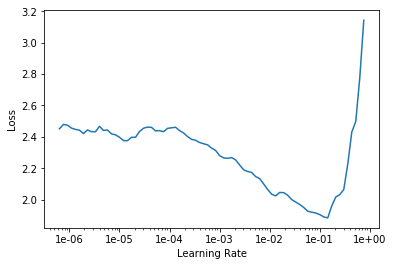

In [44]:
#Model Training
learner_alexnet.lr_find()
learner_alexnet.recorder.plot()

epoch,train_loss,valid_loss,accuracy,time
0,1.043258,0.594482,0.770492,04:31
1,0.886860,0.689660,0.770492,04:30
2,0.866543,0.506827,0.781148,04:31
3,0.731577,0.484945,0.795902,04:32
4,0.658302,0.468466,0.816393,04:30
5,0.602096,0.438117,0.817213,04:31
6,0.551233,0.442356,0.825410,04:30
7,0.517572,0.433973,0.827869,04:29


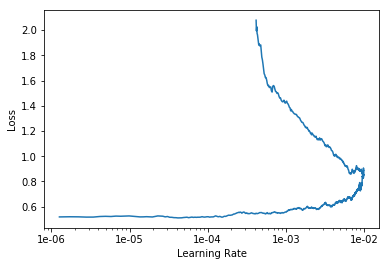

In [45]:
#find the learning rate and plot the learning rate
lr=1e-2
learner_alexnet.fit_one_cycle(8, slice(lr))
learner_alexnet.recorder.plot()
learner_alexnet.save('stage-3')

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

True

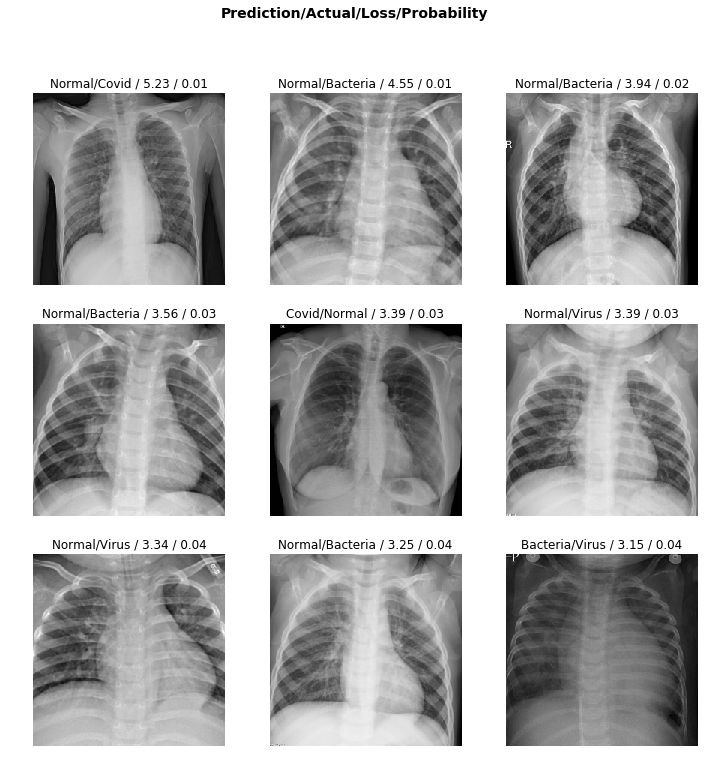

In [46]:
#Plot the losses of the model
interp=ClassificationInterpretation.from_learner(learner_alexnet)
interp.plot_top_losses(9,figsize=(12,12))
len(data.valid_ds)==len(losses)==len(idxs)

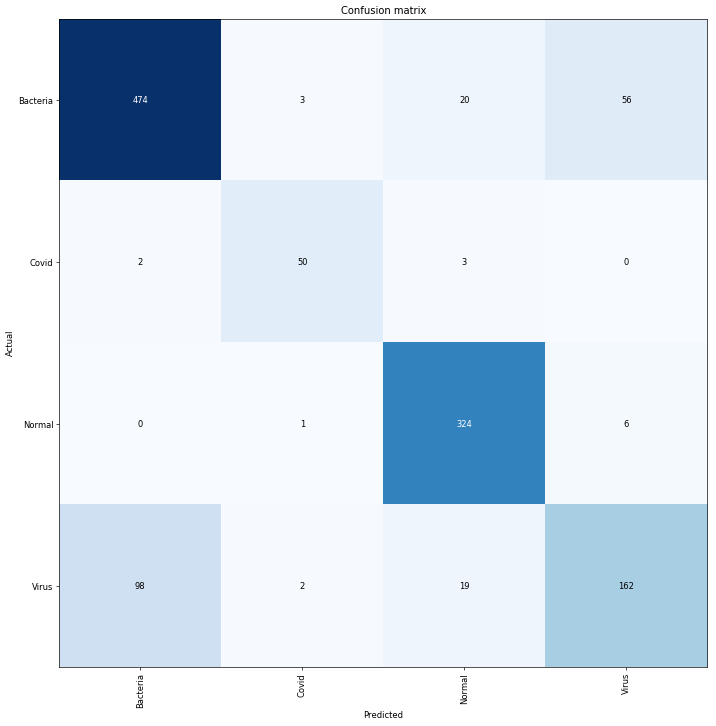

In [47]:
#Plot a confusion matrix
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

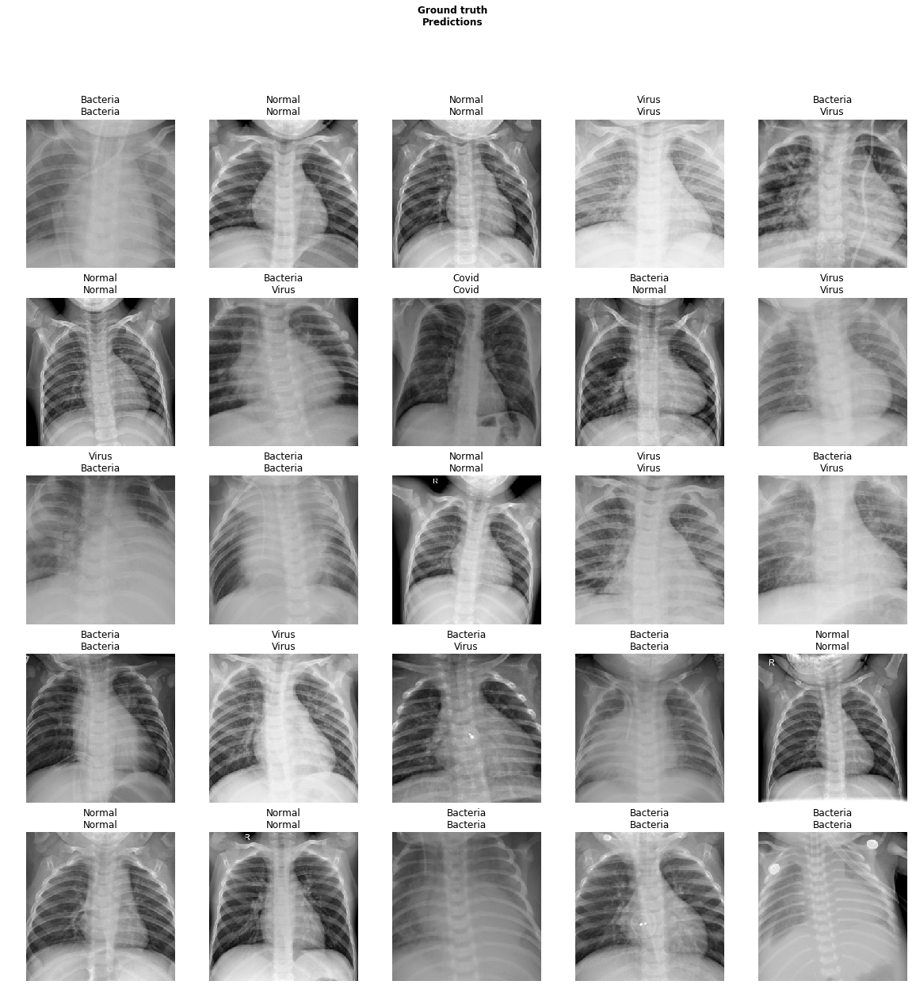

In [48]:
learner_alexnet.show_results()

# 8. Transfer Learning - densenet201

In [49]:
learner_densenet201 = cnn_learner(data,models.densenet201,metrics=accuracy)

epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


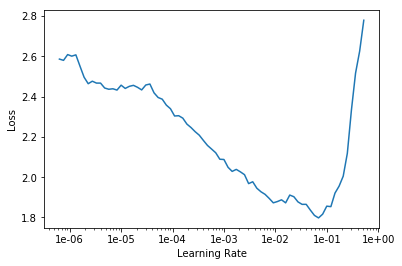

In [50]:
#Model Training
learner_densenet201.lr_find()
learner_densenet201.recorder.plot()

epoch,train_loss,valid_loss,accuracy,time
0,0.992892,0.589665,0.773771,1:12:04
1,0.730201,0.579067,0.812295,1:11:41
2,0.657350,0.491804,0.827049,1:10:30
3,0.596320,0.432080,0.836885,1:13:13
4,0.464373,0.386001,0.863934,1:11:57
5,0.419827,0.379132,0.845082,1:10:55
6,0.389365,0.360624,0.859836,1:11:17
7,0.354193,0.348679,0.863934,1:11:10


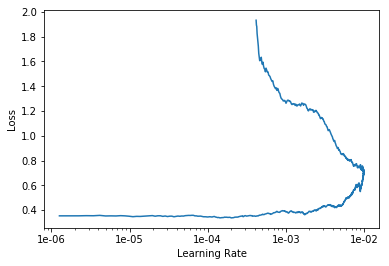

In [51]:
#find the learning rate and plot the learning rate
lr=1e-2
learner_densenet201.fit_one_cycle(8, slice(lr))
learner_densenet201.recorder.plot()
learner_densenet201.save('stage-3')

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

True

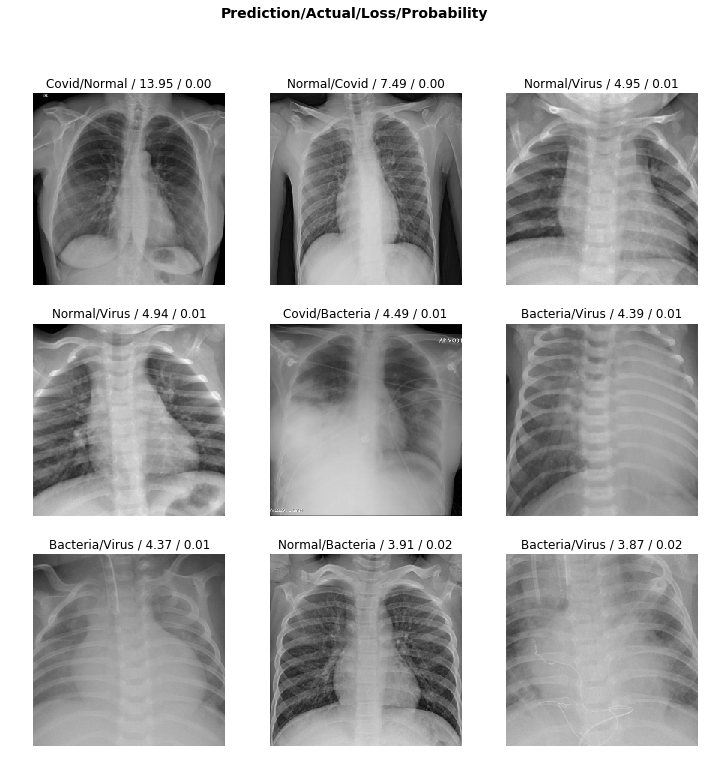

In [52]:
#Plot the losses of the model
interp=ClassificationInterpretation.from_learner(learner_densenet201)
interp.plot_top_losses(9,figsize=(12,12))
len(data.valid_ds)==len(losses)==len(idxs)

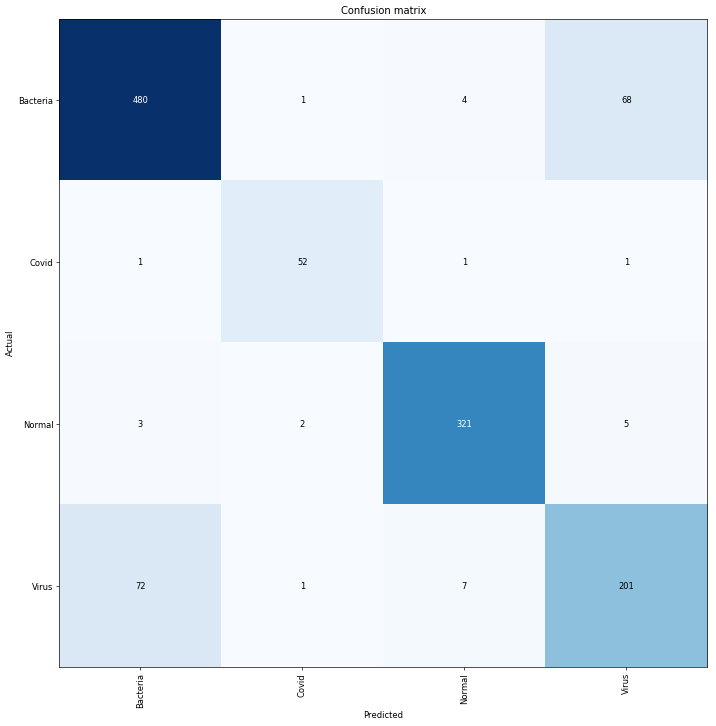

In [53]:
#Plot a confusion matrix
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

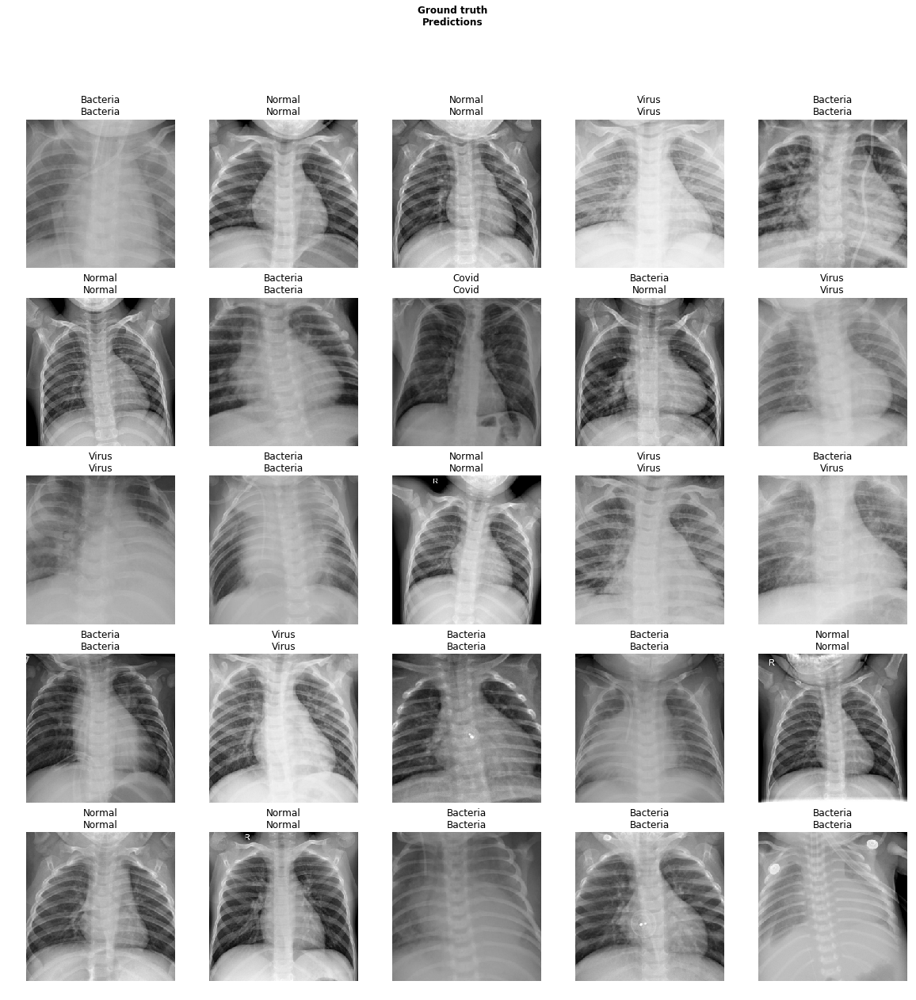

In [54]:
learner_densenet201.show_results()

# 9. Transfer Learning - Mobilenet_v2

In [55]:
learner_mobilenet_v2 = cnn_learner(data,models.mobilenet_v2 ,metrics=accuracy)

epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


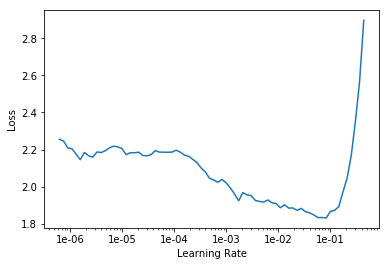

In [56]:
#Model Training
learner_mobilenet_v2.lr_find()
learner_mobilenet_v2.recorder.plot()

epoch,train_loss,valid_loss,accuracy,time
0,1.007457,0.612587,0.805738,17:55
1,0.800401,0.583562,0.804918,17:54
2,0.713383,0.476758,0.817213,17:48
3,0.578579,0.485844,0.790164,17:45
4,0.551076,0.443974,0.825410,17:49
5,0.485562,0.377999,0.840984,17:53
6,0.429825,0.372016,0.849180,17:58
7,0.401646,0.355681,0.849180,17:53


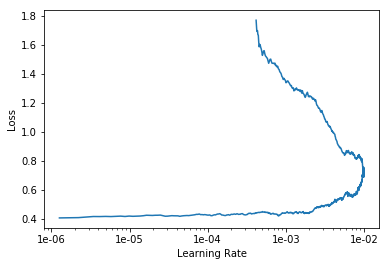

In [57]:
#find the learning rate and plot the learning rate
lr=1e-2
learner_mobilenet_v2.fit_one_cycle(8, slice(lr))
learner_mobilenet_v2.recorder.plot()
learner_mobilenet_v2.save('stage-3')

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

True

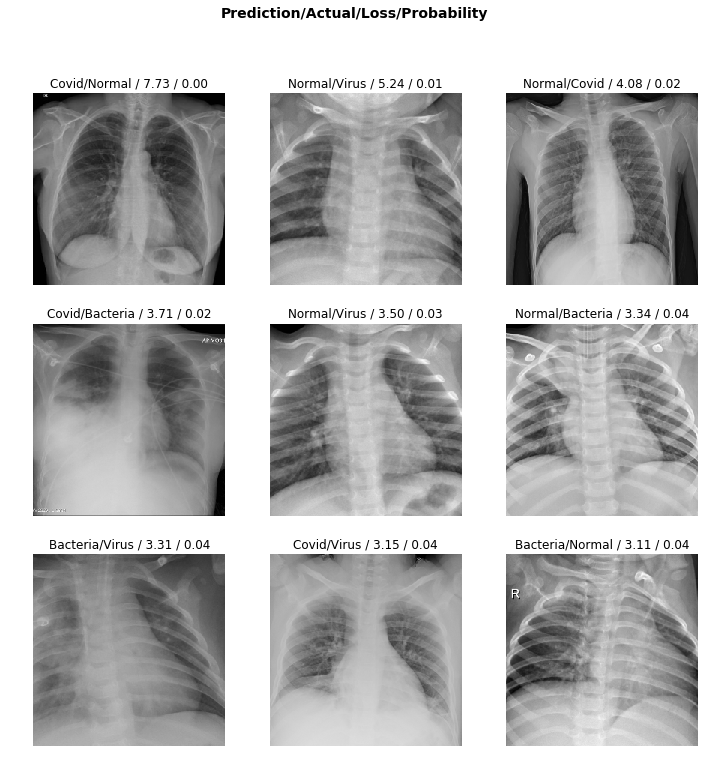

In [58]:
#Plot the losses of the model
interp=ClassificationInterpretation.from_learner(learner_mobilenet_v2)
interp.plot_top_losses(9,figsize=(12,12))
len(data.valid_ds)==len(losses)==len(idxs)

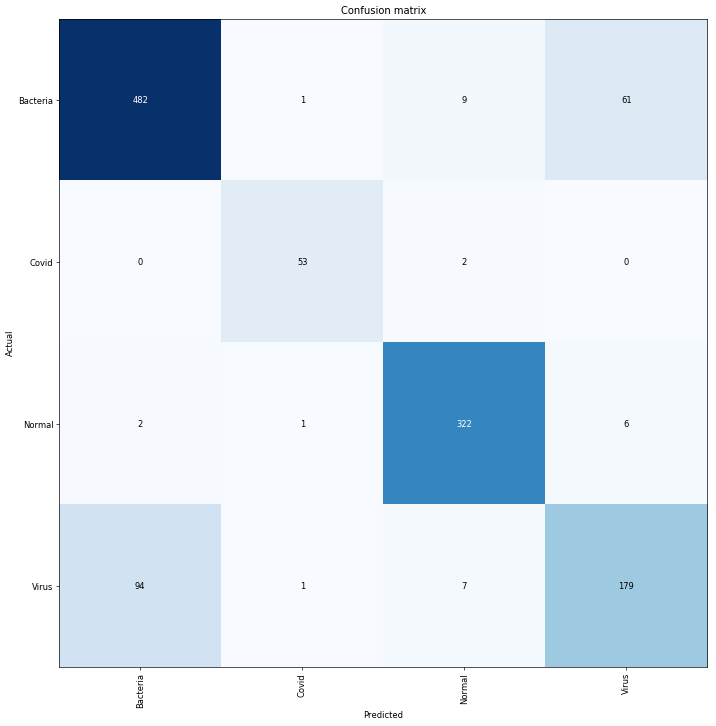

In [59]:
#Plot a confusion matrix
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

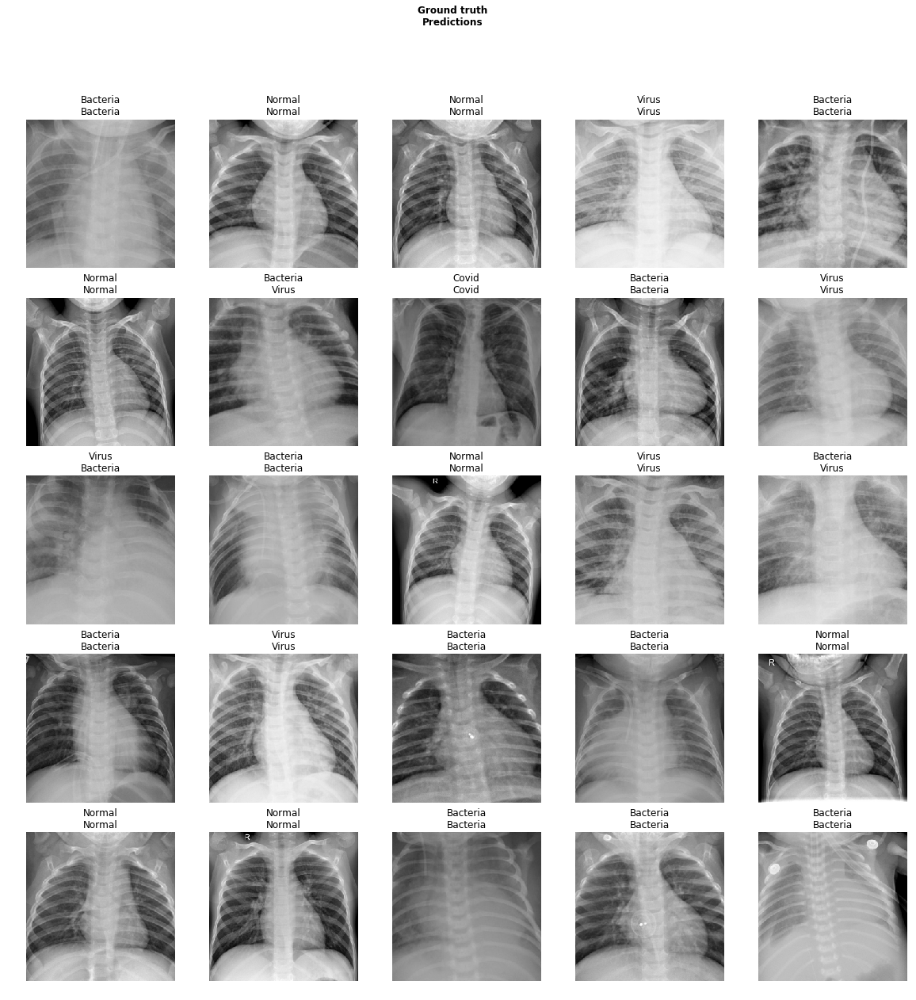

In [60]:
learner_mobilenet_v2.show_results()

# 10. Transfer Learning - Squeezenet1_1

In [61]:
learner_squeezenet1_1 = cnn_learner(data,models.squeezenet1_1 ,metrics=accuracy)

epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


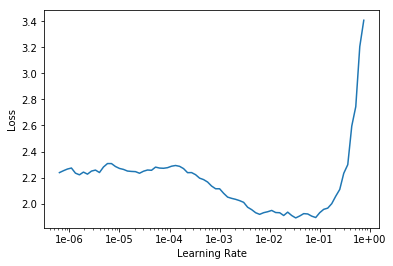

In [62]:
#Model Training
learner_squeezenet1_1.lr_find()
learner_squeezenet1_1.recorder.plot()

epoch,train_loss,valid_loss,accuracy,time
0,0.968887,0.594227,0.787705,06:00
1,0.840481,0.597839,0.783607,06:00
2,0.787240,0.571819,0.790984,05:59
3,0.692385,0.465905,0.827049,05:58
4,0.623879,0.445107,0.816393,05:57
5,0.588529,0.445468,0.812295,05:58
6,0.533890,0.420858,0.827049,05:58
7,0.517202,0.420249,0.828689,05:58


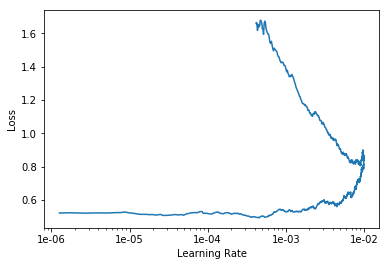

In [63]:
#find the learning rate and plot the learning rate
lr=1e-2
learner_squeezenet1_1.fit_one_cycle(8, slice(lr))
learner_squeezenet1_1.recorder.plot()
learner_squeezenet1_1.save('stage-3')

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

True

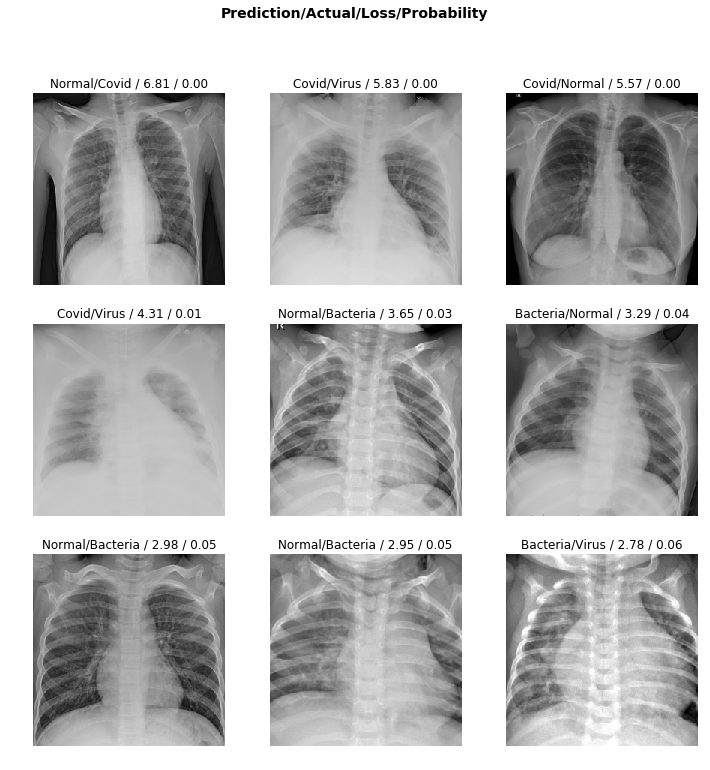

In [64]:
#Plot the losses of the model
interp=ClassificationInterpretation.from_learner(learner_squeezenet1_1)
interp.plot_top_losses(9,figsize=(12,12))
len(data.valid_ds)==len(losses)==len(idxs)

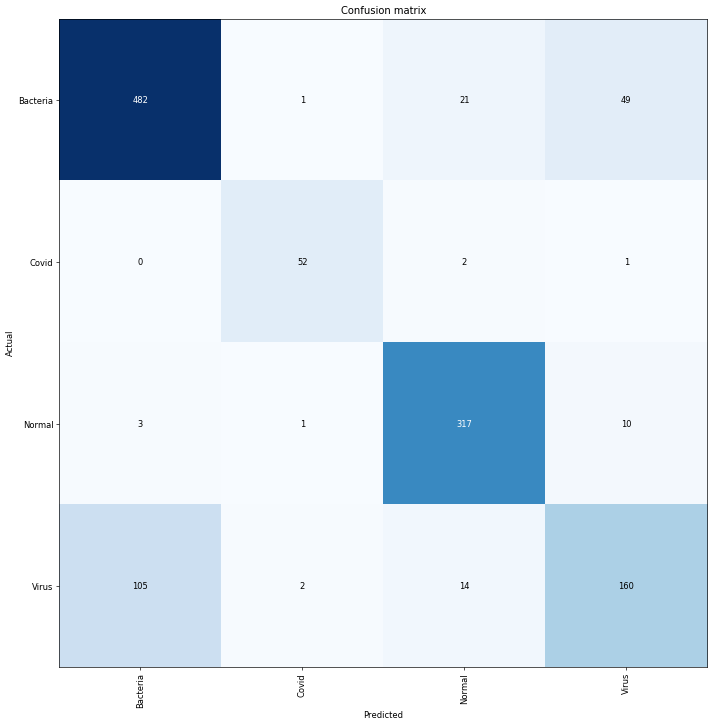

In [65]:
#Plot a confusion matrix
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
D:\Program Files\Anaconda\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for int

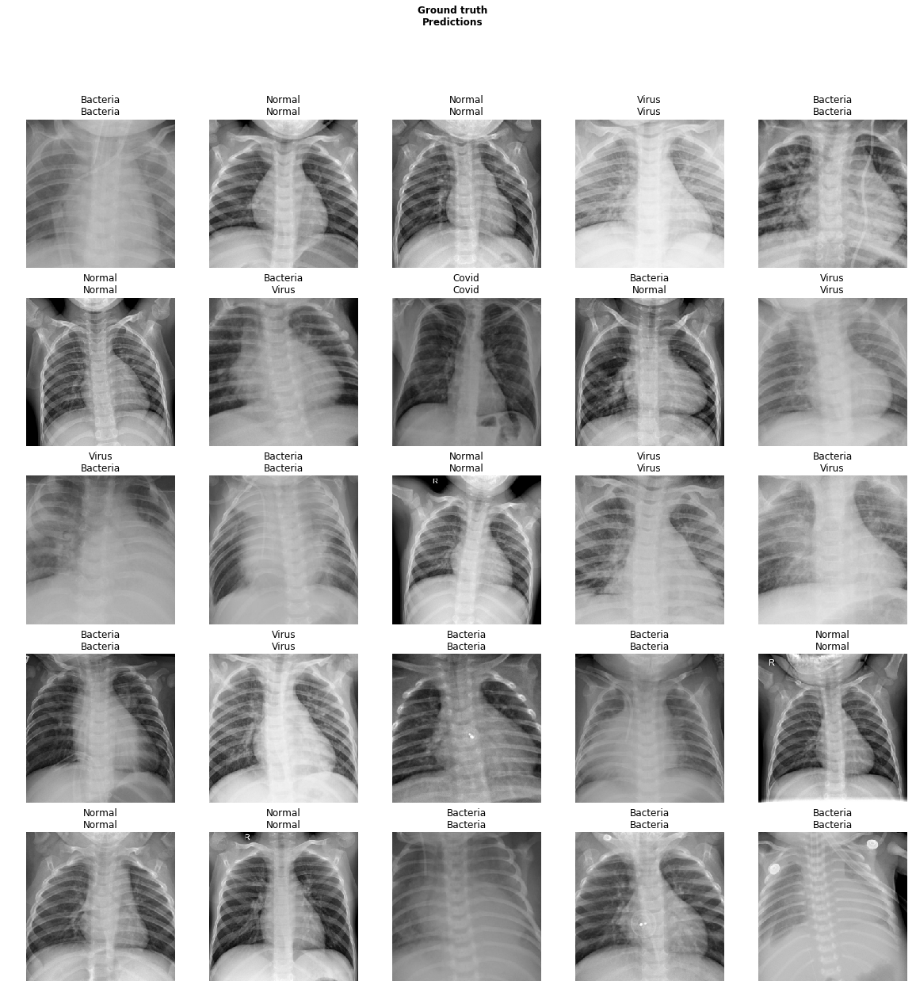

In [66]:
learner_squeezenet1_1.show_results()